In [1]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf

<b>Original attempt to import the images using the subfolders and then augmenting the images.

<b>This did not work properly, the subfolders where causing issues with the labeling of the pest species and stage.

<b>I will remove the complexity of the second layer of the subfolders and then try again.</b>

In [2]:
# Define your main folder containing subfolders
main_folder = "Documents/Pest_V2"

# Define your subfolders
subfolders = ["asiatic rice borer", "brown plant hopper", "paddy stem maggot",
              "rice gall midge", "rice leaf caterpillar", "rice leaf roller",
              "rice leafhopper", "rice water weevil", "small brown plant hopper",
              "yellow rice borer"]

# Initialize empty lists to store images, labels, and pest stages
images = []
labels = []
pest_stages = []

# Load images and assign labels and pest stages
for label, folder_name in enumerate(subfolders):
    folder_path = os.path.join(main_folder, folder_name)
    for pest_stage, subfolder_name in enumerate(["adult", "egg", "lavaera"]):
        subfolder_path = os.path.join(folder_path, subfolder_name)
        for file_name in os.listdir(subfolder_path):
            img = Image.open(os.path.join(subfolder_path, file_name))
            # Preprocess image as needed (resize, normalize, etc.)
            img = img.resize((224, 224))  # Example resizing to 224x224
            img = np.array(img) / 255.0   # Example normalization
            images.append(img)
            labels.append(label)
            pest_stages.append(subfolder_name)  # Store the pest stage


In [3]:
# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

In [4]:
# Shuffle the dataset
shuffle_indices = np.arange(len(images))
np.random.shuffle(shuffle_indices)
images = images[shuffle_indices]
labels = labels[shuffle_indices]

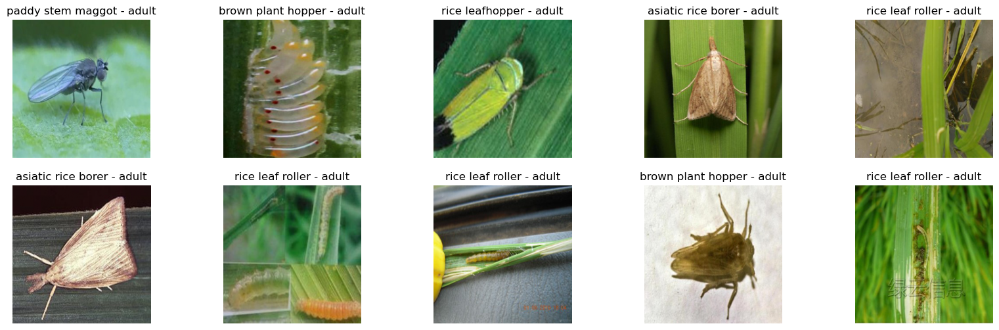

In [5]:
# Display the first 10 images with labels and pest stages
plt.figure(figsize=(20, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.title(f"{subfolders[labels[i]]} - {pest_stages[i]}")
    plt.axis('off')
plt.show()

In [6]:
images.shape

(3159, 224, 224, 3)

In [7]:
def plot_learning(history):
    # Plot training & validation loss values
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    plt.figure(figsize=(8, 6))
    plt.plot(training_loss, label='loss')
    plt.plot(validation_loss, label='Val_loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()

    # Plot training & validation accuracy values
    training_accuracy = history.history['accuracy']
    validation_accuracy = history.history['val_accuracy']
    plt.figure(figsize=(8, 6))
    plt.plot(training_accuracy, label='accuracy')
    plt.plot(validation_accuracy, label='Val_accuracy')
    plt.title('Training and Validation accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    plt.show()

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an ImageDataGenerator instance with desired transformations
datagen = ImageDataGenerator(
    rotation_range=20,      # Randomly rotate images by up to 20 degrees
    width_shift_range=0.2,  # Randomly shift images horizontally by up to 20% of the width
    height_shift_range=0.2, # Randomly shift images vertically by up to 20% of the height
    shear_range=0.2,        # Apply shear transformation with a maximum shear intensity of 20%
    zoom_range=0.2,         # Randomly zoom into images by up to 20%
    horizontal_flip=True,   # Randomly flip images horizontally
    vertical_flip=True,     # Randomly flip images vertically
)

In [9]:
# Specify the number of new images you want to generate per original image
num_new_images = 5

In [10]:
# Transform each original image and store the augmented images
augmented_images = []
augmented_labels = []
augmented_pest_stages = []

for img, label, stage in zip(images, labels, pest_stages):
    img = img.reshape((1,) + img.shape)  # Reshape to fit the flow method
    i = 0
    for batch in datagen.flow(img, batch_size=1):
        augmented_images.append(batch[0])
        augmented_labels.append(label)
        augmented_pest_stages.append(stage)  # Append pest stage
        i += 1
        if i >= num_new_images:
            break

# Combine original and augmented data
augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)
augmented_pest_stages = np.array(augmented_pest_stages)

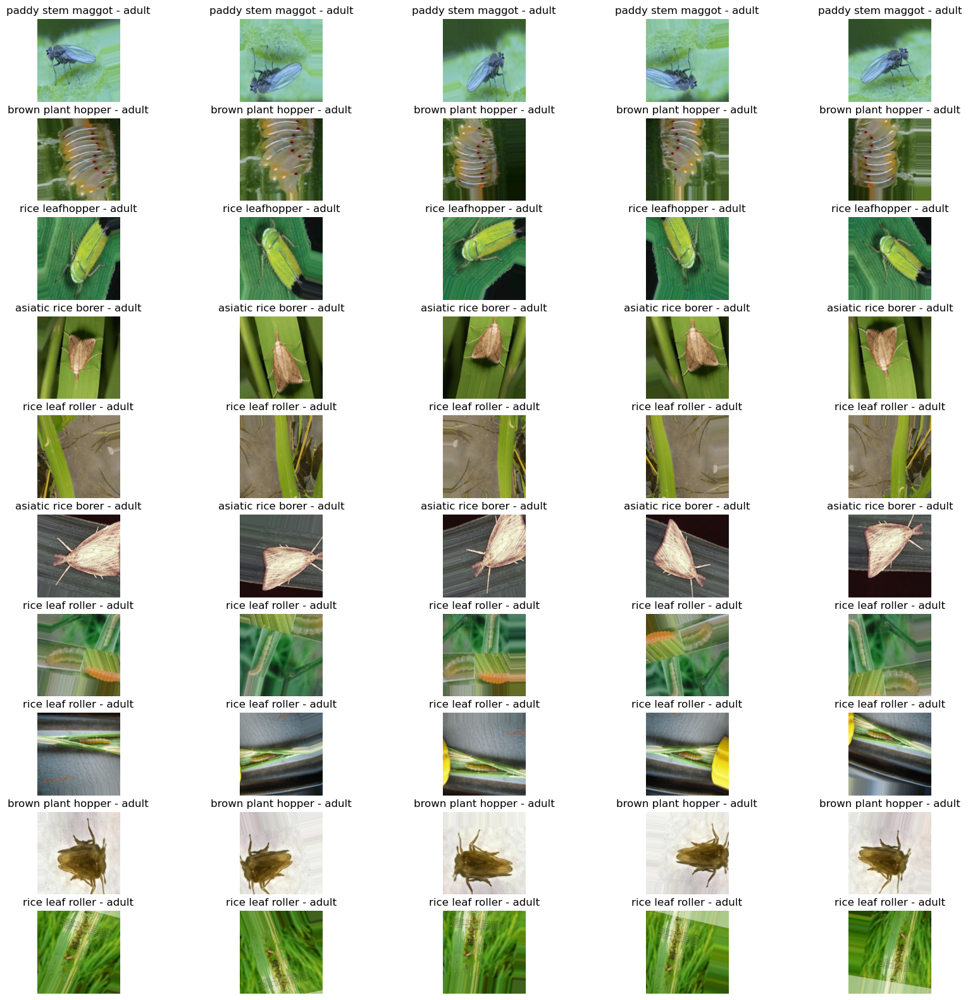

In [11]:
# Display the first 10 images with labels and pest stages
plt.figure(figsize=(20, 20))
for i in range(50):
    plt.subplot(10, 5, i + 1)
    plt.imshow(augmented_images[i])
    plt.title(f"{subfolders[augmented_labels[i]]} - {augmented_pest_stages[i]}")
    plt.axis('off')
plt.show()

In [12]:
augmented_images.shape

(15795, 224, 224, 3)

In [13]:
# Combine augmented labels with pest stages
combined_augmented_labels = [f"{subfolders[label]} - {augmented_pest_stages[i]}" for i, label in enumerate(augmented_labels)]
combined_augmented_labels_array = np.array(combined_augmented_labels)

# Find unique combined labels and their counts for augmented images
unique_combined_augmented_labels, augmented_counts = np.unique(combined_augmented_labels_array, return_counts=True)

# Print the list of unique combined labels and their counts for augmented images
print("\nUnique Labels for Augmented Images:")
for label, count in zip(unique_combined_augmented_labels, augmented_counts):
    print(f"{label}: {count} occurrences")


Unique Labels for Augmented Images:
asiatic rice borer - adult: 1665 occurrences
asiatic rice borer - egg: 50 occurrences
asiatic rice borer - lavaera: 775 occurrences
brown plant hopper - adult: 1190 occurrences
brown plant hopper - egg: 15 occurrences
brown plant hopper - lavaera: 525 occurrences
paddy stem maggot - adult: 320 occurrences
paddy stem maggot - egg: 5 occurrences
paddy stem maggot - lavaera: 120 occurrences
rice gall midge - adult: 725 occurrences
rice gall midge - egg: 35 occurrences
rice gall midge - lavaera: 340 occurrences
rice leaf caterpillar - adult: 515 occurrences
rice leaf caterpillar - egg: 15 occurrences
rice leaf caterpillar - lavaera: 235 occurrences
rice leaf roller - adult: 2485 occurrences
rice leaf roller - egg: 60 occurrences
rice leaf roller - lavaera: 1035 occurrences
rice leafhopper - adult: 895 occurrences
rice leafhopper - egg: 15 occurrences
rice leafhopper - lavaera: 310 occurrences
rice water weevil - adult: 1410 occurrences
rice water weevil

In [14]:
print("Length of augmented_labels:", len(augmented_labels))
print("Length of pest_stages:", len(augmented_pest_stages))

Length of augmented_labels: 15795
Length of pest_stages: 15795




<b>
------------------------------------------------
    
<b>Retrying the image import and augmentation using the simplified data folder structure</b>

In [15]:
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split

# Define your main folder containing subfolders
main_folder = "Documents/Pest_V2_simple"
image_size = (224, 224)  # Resize images to 100x100 pixels

# Initialize lists to store images and labels
images = []
labels = []

# Iterate through subfolders
for label, subfolder in enumerate(os.listdir(main_folder)):
    subfolder_path = os.path.join(main_folder, subfolder)
    
    # Check if it's a directory
    if os.path.isdir(subfolder_path):
        # Iterate through images in the subfolder
        for image_file in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_file)
            
            # Load and resize image
            image = imread(image_path)
            image = resize(image, image_size)
            
            # Append image and label to lists
            images.append(image)
            labels.append(label)

In [16]:
images = np.array(images)
labels = np.array(labels)

In [17]:
print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (3159, 224, 224, 3)
Labels shape: (3159,)


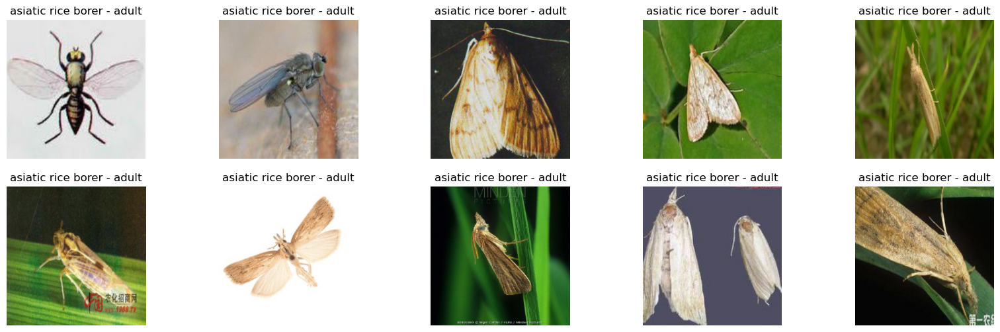

In [18]:
# Define subfolders as the names of the subfolders
subfolders = os.listdir(main_folder)

# Display the first 10 images with labels
plt.figure(figsize=(20, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.title(f"{subfolders[labels[i]]}")
    plt.axis('off')
plt.show()

In [19]:
images.shape

(3159, 224, 224, 3)

In [20]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an ImageDataGenerator instance with desired transformations
datagen = ImageDataGenerator(
    rotation_range=20,      # Randomly rotate images by up to 20 degrees
    width_shift_range=0.2,  # Randomly shift images horizontally by up to 20% of the width
    height_shift_range=0.2, # Randomly shift images vertically by up to 20% of the height
    shear_range=0.2,        # Apply shear transformation with a maximum shear intensity of 20%
    zoom_range=0.2,         # Randomly zoom into images by up to 20%
    horizontal_flip=True,   # Randomly flip images horizontally
    vertical_flip=True,     # Randomly flip images vertically
)

In [21]:
# Specify the number of new images you want to generate per original image
num_new_images = 5

In [22]:
augmented_images = []
augmented_labels = []

for img, label in zip(images, labels):
    img = img.reshape((1,) + img.shape)
    i = 0
    for batch in datagen.flow(img, batch_size=1):
        augmented_images.append(batch[0])
        augmented_labels.append(label)
        i += 1
        if i >= num_new_images:
            break

augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

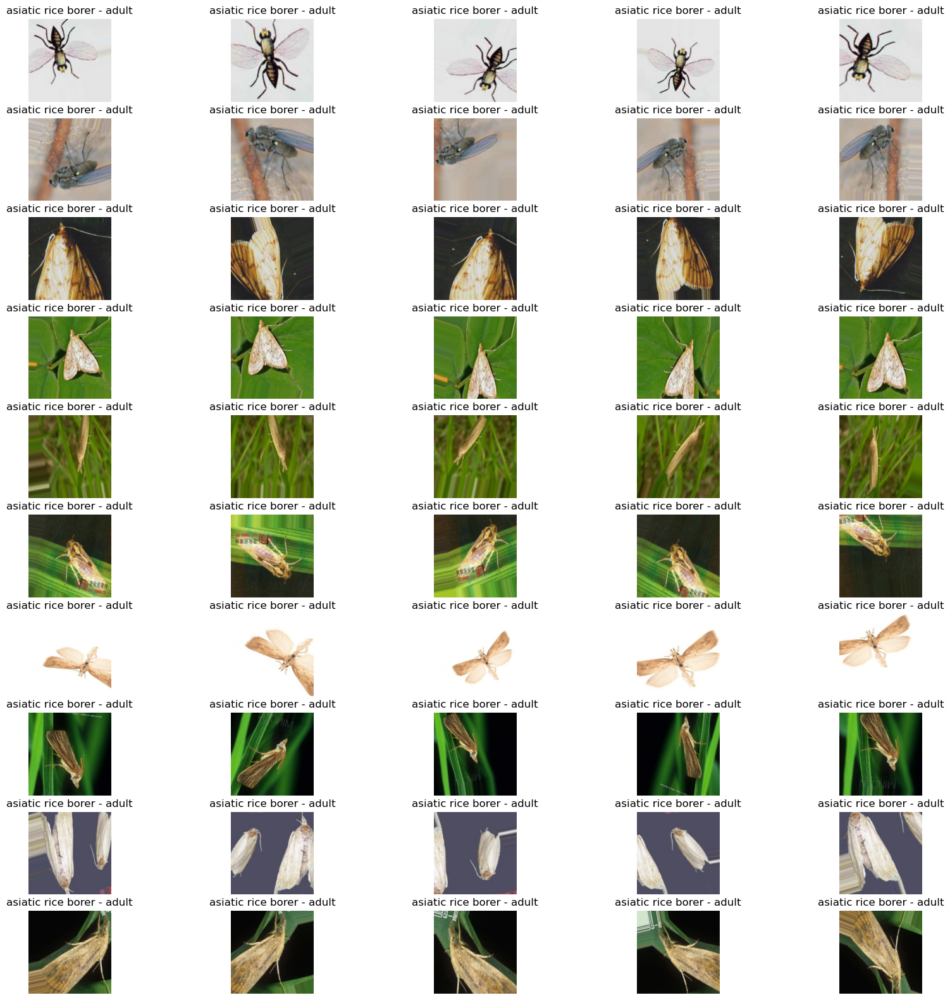

In [23]:
plt.figure(figsize=(20, 20))
for i in range(50):
    plt.subplot(10, 5, i + 1)
    plt.imshow(augmented_images[i])
    plt.title(f"{subfolders[augmented_labels[i]]}")
    plt.axis('off')
plt.show()

In [24]:
print("Number of augmented images:", len(augmented_images))
print("Number of augmented labels:", len(augmented_labels))

Number of augmented images: 15795
Number of augmented labels: 15795


In [25]:
# Combine labels of original images and augmented images
combined_labels = np.concatenate((labels, augmented_labels), axis=0)

# Find unique combined labels and their counts
unique_combined_labels, counts = np.unique(combined_labels, return_counts=True)

# Print the list of unique combined labels and their counts
print("Unique Labels:")
for label, count in zip(unique_combined_labels, counts):
    print(f"{subfolders[label]}: {count} occurrences")

Unique Labels:
asiatic rice borer - adult: 930 occurrences
asiatic rice borer - egg: 144 occurrences
asiatic rice borer - lavaera: 1914 occurrences
brown plant hopper - adult: 2010 occurrences
brown plant hopper - egg: 42 occurrences
brown plant hopper - lavaera: 24 occurrences
paddy stem maggot - adult: 516 occurrences
paddy stem maggot - egg: 6 occurrences
paddy stem maggot - lavaera: 12 occurrences
rice gall midge - adult: 1320 occurrences
rice leaf caterpillar - adult: 648 occurrences
rice leaf caterpillar - egg: 6 occurrences
rice leaf caterpillar - lavaera: 264 occurrences
rice leaf roller - adult: 906 occurrences
rice leaf roller - egg: 18 occurrences
rice leaf roller - lavaera: 3372 occurrences
rice leafhopper - adult: 1458 occurrences
rice leafhopper - egg: 6 occurrences
rice water weevil - adult: 2484 occurrences
small brown plant hopper - adult: 1458 occurrences
yellow rice borer - adult: 1278 occurrences
yellow rice borer - egg: 108 occurrences
yellow rice borer - lavaera: 

In [26]:
print("Length of augmented_labels:", len(augmented_labels))

Length of augmented_labels: 15795


<b>Creating CNN for image clasification

In [27]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [28]:
# Split the augmented images and labels into training and temporary data (80% training, 20% temp)
X_train_temp, X_test, y_train_temp, y_test = train_test_split(augmented_images, augmented_labels, test_size=0.2, random_state=42, stratify=augmented_labels)

# Split the temporary data into validation and testing data (50% validation, 50% testing)
X_train, X_val, y_train, y_val = train_test_split(X_train_temp, y_train_temp, test_size=0.5, random_state=42, stratify=y_train_temp)

# Verify the shapes of the datasets
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (6318, 224, 224, 3)
Shape of y_train: (6318,)
Shape of X_val: (6318, 224, 224, 3)
Shape of y_val: (6318,)
Shape of X_test: (3159, 224, 224, 3)
Shape of y_test: (3159,)


In [29]:
# Print unique label values in y_train
print("Unique labels in y_train:", np.unique(y_train))

# Print unique label values in y_val
print("Unique labels in y_val:", np.unique(y_val))

# Print unique label values in y_test
print("Unique labels in y_val:", np.unique(y_test))

Unique labels in y_train: [ 0  1  2  3  4  5  6  7  8  9 12 13 14 15 16 17 18 19 21 24 27 28 29]
Unique labels in y_val: [ 0  1  2  3  4  5  6  7  8  9 12 13 14 15 16 17 18 19 21 24 27 28 29]
Unique labels in y_val: [ 0  1  2  3  4  5  6  7  8  9 12 13 14 15 16 17 18 19 21 24 27 28 29]


In [30]:
# Define the CNN architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(30, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

C:\Users\mhbra\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 30)                  │           3,870 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,172,830 (42.62 MB)

 Trainable params: 11,172,830 (42.62 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 97s 473ms/step - accuracy: 0.1822 - loss: 2.6304 - val_accuracy: 0.2640 - val_loss: 2.3132
Epoch 2/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 90s 457ms/step - accuracy: 0.2907 - loss: 2.2307 - val_accuracy: 0.3094 - val_loss: 2.1705
Epoch 3/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 88s 447ms/step - accuracy: 0.3691 - loss: 1.9749 - val_accuracy: 0.3735 - val_loss: 2.0596
Epoch 4/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 87s 440ms/step - accuracy: 0.4992 - loss: 1.5910 - val_accuracy: 0.3688 - val_loss: 2.1155
Epoch 5/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 89s 451ms/step - accuracy: 0.6725 - loss: 1.0723 - val_accuracy: 0.3772 - val_loss: 2.4547
Epoch 6/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 89s 449ms/step - accuracy: 0.8143 - loss: 0.5943 - val_accuracy: 0.3737 - val_loss: 3.1241
Epoch 7/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 88s 446ms/step - accuracy: 0.9076 - loss: 0.3177 - val_accuracy: 0.3729 - val_loss: 4.0194
Epoch 8/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 88s 447ms/step - accuracy: 0.9564 - loss: 0

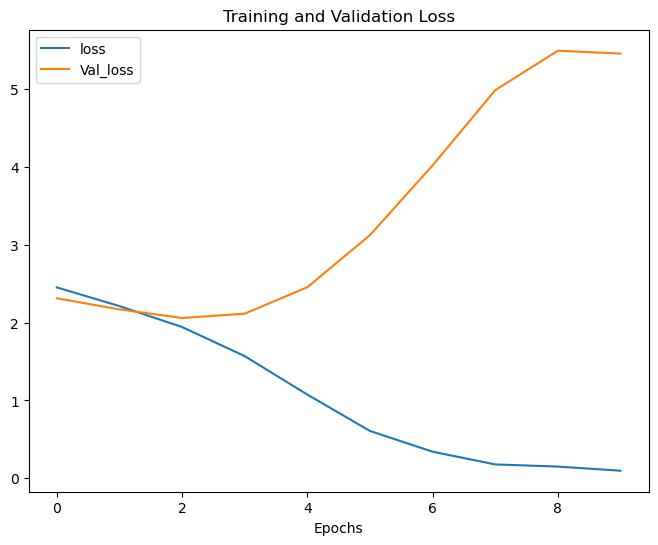

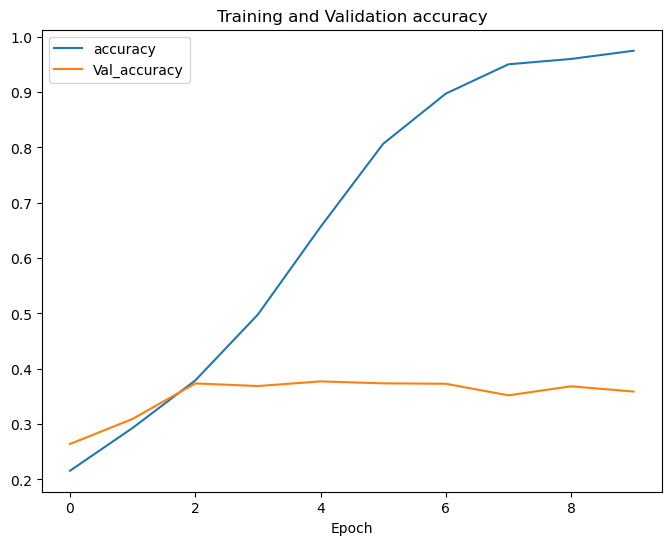

In [32]:
plot_learning(history)

In [33]:
# Evaluate the model on the testing data
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - accuracy: 0.3347 - loss: 5.5979
Test Loss: 5.60384464263916
Test Accuracy: 0.3491611182689667


<b> This initial modle has quickly overfitted the trining data. The traing accuracy is very high while tha validation accuracy remains low.
<b>This time I am going to use all the original categories but use a pre-trained model ResNet-50 and see if that imporves the results.

In [33]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Load the pre-trained ResNet50 model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False
    
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(30, activation='softmax')(x)

# Create the final model
model_r50 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_r50.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model_r50.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 230, 230, 3)       │               0 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 112, 112, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_bn (BatchNormalization) │ (None, 112, 112, 64)      │             256 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_relu (Activation)       │ (None, 112, 112, 64)      │               0 │ conv1_bn[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 114, 114, 64)      │               0 │ conv1_relu[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 56, 56, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 56, 56, 64)        │           4,160 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 56, 56, 64)        │          36,928 │ conv2_block1_1_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_conv (Conv2D)  │ (None, 56, 56, 256)       │          16,640 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_3_conv (Conv2D)  │ (None, 56, 56, 256)       │          16,640 │ conv2_block1_2_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 23,853,854 (91.00 MB)

 Trainable params: 266,142 (1.02 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [34]:
# Fit the model to the augmented training data
history = model_r50.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 334s 2s/step - accuracy: 0.1599 - loss: 2.6418 - val_accuracy: 0.1857 - val_loss: 2.4867
Epoch 2/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 311s 2s/step - accuracy: 0.1738 - loss: 2.5064 - val_accuracy: 0.2042 - val_loss: 2.4666
Epoch 3/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 295s 1s/step - accuracy: 0.1911 - loss: 2.4829 - val_accuracy: 0.2053 - val_loss: 2.4338
Epoch 4/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 294s 1s/step - accuracy: 0.2034 - loss: 2.4436 - val_accuracy: 0.2016 - val_loss: 2.4331
Epoch 5/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 293s 1s/step - accuracy: 0.2017 - loss: 2.4306 - val_accuracy: 0.2021 - val_loss: 2.4253
Epoch 6/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 292s 1s/step - accuracy: 0.2137 - loss: 2.4018 - val_accuracy: 0.2016 - val_loss: 2.4129
Epoch 7/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 290s 1s/step - accuracy: 0.2182 - loss: 2.3855 - val_accuracy: 0.2124 - val_loss: 2.3867
Epoch 8/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 288s 1s/step - accuracy: 0.2240 - loss: 2.3584 - val_accu

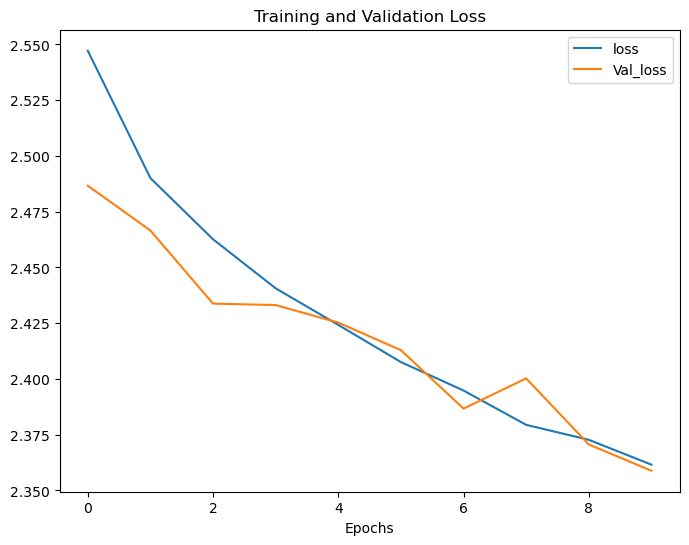

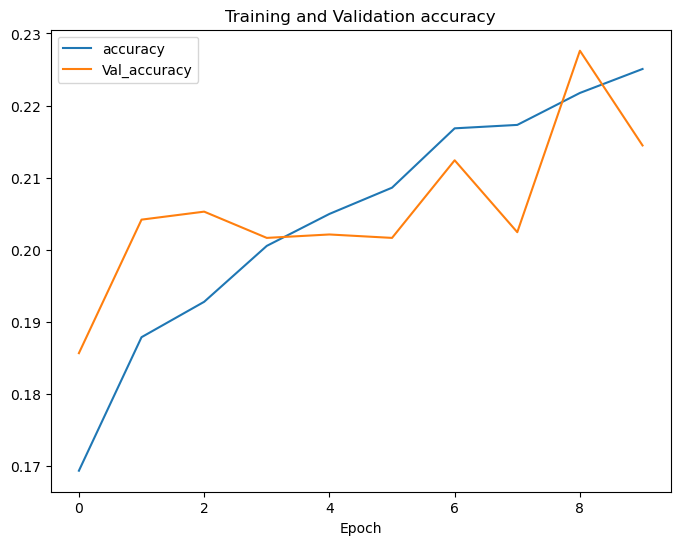

In [35]:
plot_learning(history)

In [36]:
# Evaluate the model on the testing data
test_loss, test_accuracy = model_r50.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

99/99 ━━━━━━━━━━━━━━━━━━━━ 72s 731ms/step - accuracy: 0.2087 - loss: 2.3712
Test Loss: 2.3587090969085693
Test Accuracy: 0.21747387945652008


<b> the data being split into so many categories might be the cause of the low accuracy. I am going to combine each species into one category which will combine Adults, Eggs, and Larva. I am not sure if this will work because of the vast diffrences between the appaerences of the adults, eggs, and Larva of each species.

<b> Importing, augmenting, and vizulizing data set that has adult, egg, and lavaera combined into one category (species only)

In [10]:
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split

# Define your main folder containing subfolders
main_folder = "Documents/Pest_V2_one_group"
image_size = (224, 224)

# Initialize lists to store images and labels
images = []
labels = []

# Iterate through subfolders
for label, subfolder in enumerate(os.listdir(main_folder)):
    subfolder_path = os.path.join(main_folder, subfolder)
    
    # Check if it's a directory
    if os.path.isdir(subfolder_path):
        # Iterate through images in the subfolder
        for image_file in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_file)
            
            # Load and resize image
            image = imread(image_path)
            image = resize(image, image_size)
            
            # Append image and label to lists
            images.append(image)
            labels.append(label)

In [11]:
images = np.array(images)
labels = np.array(labels)

In [12]:
print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (3159, 224, 224, 3)
Labels shape: (3159,)


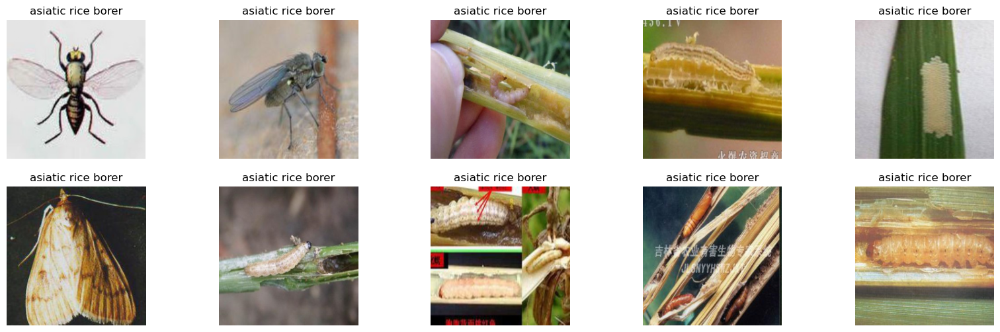

In [13]:
# Define subfolders as the names of the subfolders
subfolders = os.listdir(main_folder)

# Display the first 10 images with labels
plt.figure(figsize=(20, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.title(f"{subfolders[labels[i]]}")
    plt.axis('off')
plt.show()

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an ImageDataGenerator instance with desired transformations
datagen = ImageDataGenerator(
    rotation_range=20,      # Randomly rotate images by up to 20 degrees
    width_shift_range=0.2,  # Randomly shift images horizontally by up to 20% of the width
    height_shift_range=0.2, # Randomly shift images vertically by up to 20% of the height
    shear_range=0.2,        # Apply shear transformation with a maximum shear intensity of 20%
    zoom_range=0.2,         # Randomly zoom into images by up to 20%
    horizontal_flip=True,   # Randomly flip images horizontally
    vertical_flip=True,     # Randomly flip images vertically
)

In [15]:
# Specify the number of new images you want to generate per original image
num_new_images = 5

In [16]:
augmented_images = []
augmented_labels = []

for img, label in zip(images, labels):
    img = img.reshape((1,) + img.shape)
    i = 0
    for batch in datagen.flow(img, batch_size=1):
        augmented_images.append(batch[0])
        augmented_labels.append(label)
        i += 1
        if i >= num_new_images:
            break

augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

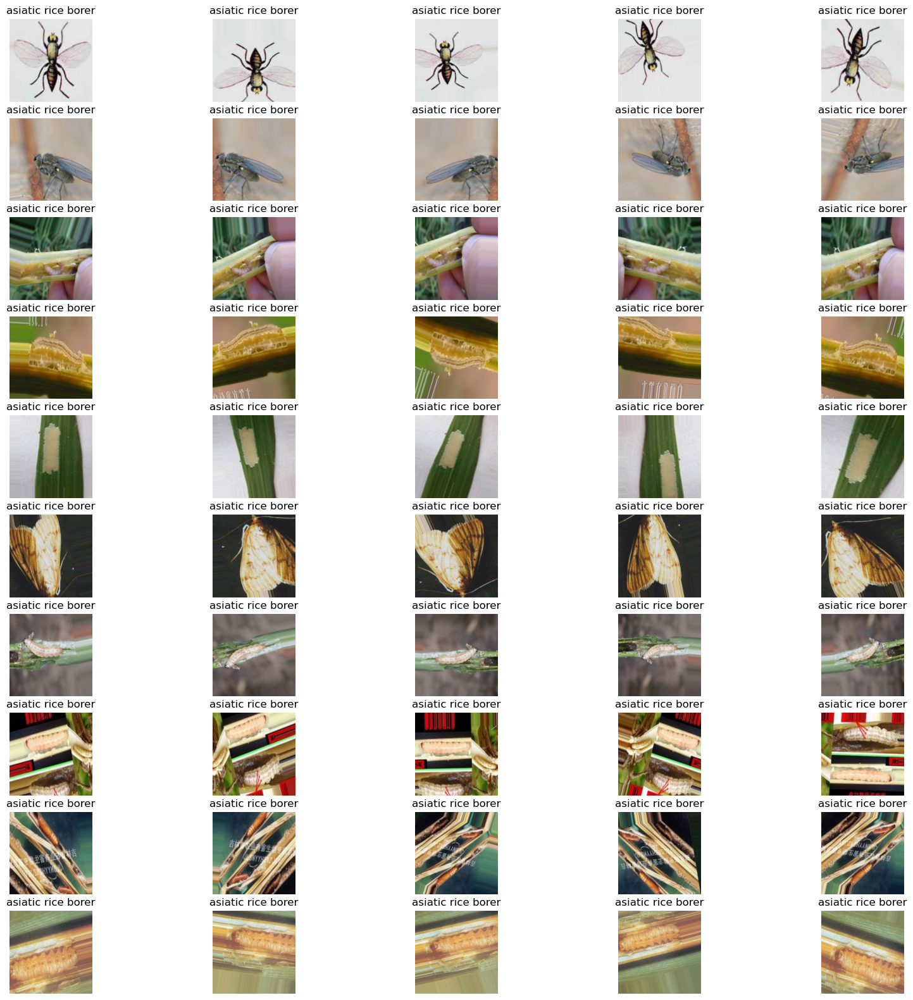

In [17]:
plt.figure(figsize=(20, 20))
for i in range(50):
    plt.subplot(10, 5, i + 1)
    plt.imshow(augmented_images[i])
    plt.title(f"{subfolders[augmented_labels[i]]}")
    plt.axis('off')
plt.show()

In [18]:
print("Number of augmented images:", len(augmented_images))
print("Number of augmented labels:", len(augmented_labels))

Number of augmented images: 15795
Number of augmented labels: 15795


In [19]:
# Combine labels of original images and augmented images
combined_labels = np.concatenate((labels, augmented_labels), axis=0)

# Find unique combined labels and their counts
unique_combined_labels, counts = np.unique(combined_labels, return_counts=True)

# Print the list of unique combined labels and their counts
print("Unique Labels:")
for label, count in zip(unique_combined_labels, counts):
    print(f"{subfolders[label]}: {count} occurrences")

Unique Labels:
asiatic rice borer: 2988 occurrences
brown plant hopper: 2076 occurrences
paddy stem maggot: 534 occurrences
rice gall midge: 1320 occurrences
rice leaf caterpillar: 918 occurrences
rice leaf roller: 4296 occurrences
rice leafhopper: 1464 occurrences
rice water weevil: 2484 occurrences
small brown plant hopper: 1458 occurrences
yellow rice borer: 1416 occurrences


In [20]:
# Split the augmented images and labels into training and temporary data (80% training, 20% temp)
X_train_temp, X_test, y_train_temp, y_test = train_test_split(augmented_images, augmented_labels, test_size=0.2, random_state=42, stratify=augmented_labels)

# Split the temporary data into validation and testing data (50% validation, 50% testing)
X_train, X_val, y_train, y_val = train_test_split(X_train_temp, y_train_temp, test_size=0.5, random_state=42, stratify=y_train_temp)

# Verify the shapes of the datasets
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (6318, 224, 224, 3)
Shape of y_train: (6318,)
Shape of X_val: (6318, 224, 224, 3)
Shape of y_val: (6318,)
Shape of X_test: (3159, 224, 224, 3)
Shape of y_test: (3159,)


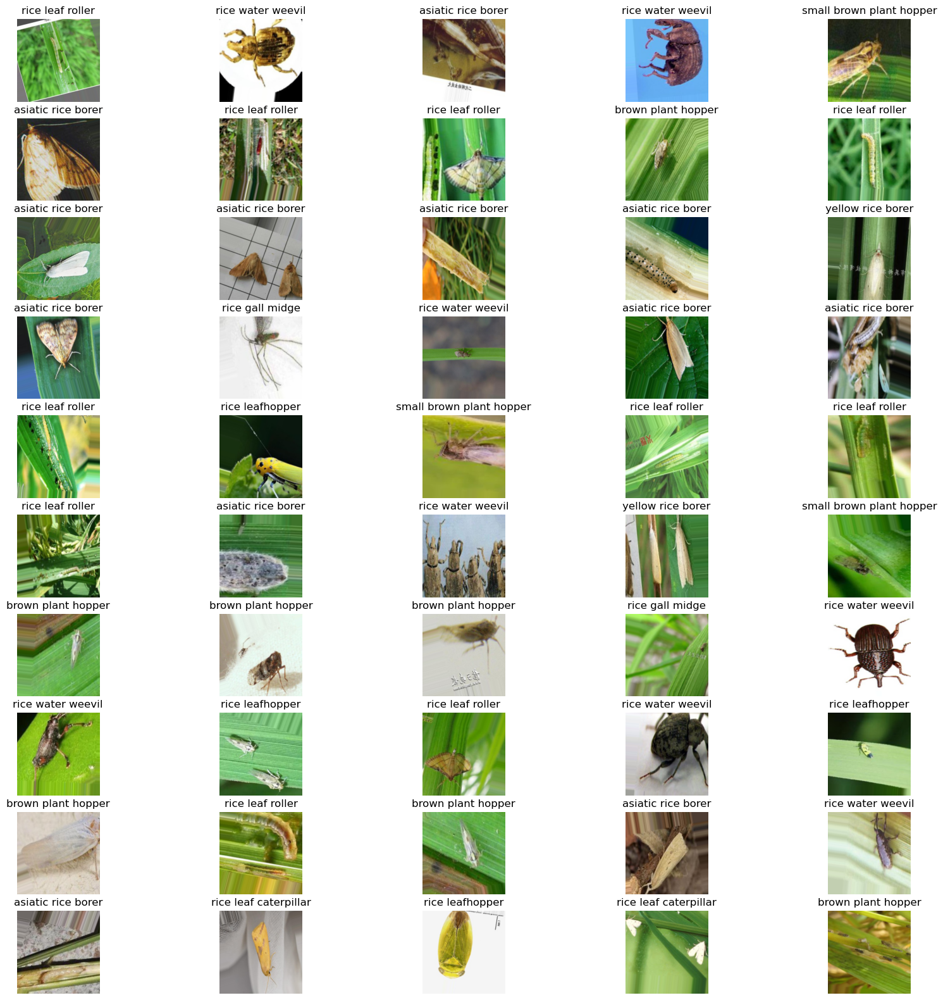

In [21]:
plt.figure(figsize=(20, 20))
for i in range(50):
    plt.subplot(10, 5, i + 1)
    plt.imshow(X_train[i])
    plt.title(f"{subfolders[y_train[i]]}")
    plt.axis('off')
plt.show()

In [22]:
# Assuming y_train is your target labels
print("Shape of y_train:", y_train.shape)
print("Unique values in y_train:", np.unique(y_train))

Shape of y_train: (6318,)
Unique values in y_train: [0 1 2 3 4 5 6 7 8 9]


<b> create new model for only 10 categories

In [49]:
# Define the CNN architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

C:\Users\mhbra\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,170,250 (42.61 MB)

 Trainable params: 11,170,250 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [50]:
# Fit the model with the new training data
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 98s 481ms/step - accuracy: 0.2339 - loss: 2.1948 - val_accuracy: 0.3116 - val_loss: 2.0002
Epoch 2/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 88s 446ms/step - accuracy: 0.3220 - loss: 1.9689 - val_accuracy: 0.3287 - val_loss: 1.9596
Epoch 3/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 86s 434ms/step - accuracy: 0.3719 - loss: 1.8189 - val_accuracy: 0.3754 - val_loss: 1.8364
Epoch 4/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 85s 428ms/step - accuracy: 0.4842 - loss: 1.5180 - val_accuracy: 0.4025 - val_loss: 1.9057
Epoch 5/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 84s 423ms/step - accuracy: 0.6455 - loss: 1.0390 - val_accuracy: 0.3883 - val_loss: 2.0772
Epoch 6/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 84s 423ms/step - accuracy: 0.8052 - loss: 0.6042 - val_accuracy: 0.3845 - val_loss: 2.7932
Epoch 7/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 83s 419ms/step - accuracy: 0.9051 - loss: 0.3080 - val_accuracy: 0.3805 - val_loss: 3.6903
Epoch 8/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 83s 419ms/step - accuracy: 0.9466 - loss: 0

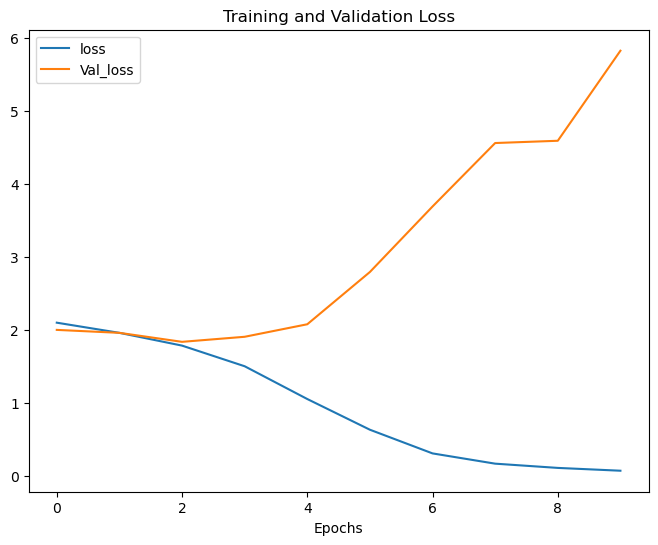

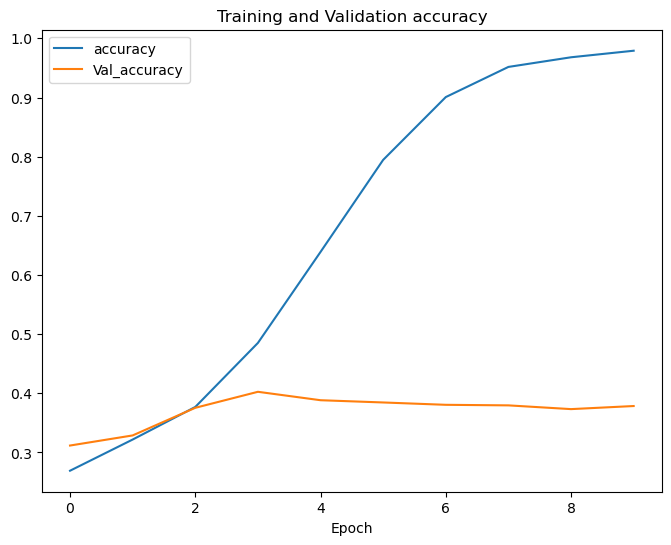

In [51]:
plot_learning(history)

In [52]:
# Evaluate the model on the testing data
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

99/99 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.3942 - loss: 5.7601
Test Loss: 5.7702531814575195
Test Accuracy: 0.3798670470714569


<b> ResNet-50 with the combined data

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Load the pre-trained ResNet50 model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False
    
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(10, activation='softmax')(x)

# Create the final model
model_r50 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_r50.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model_r50.summary()

In [ ]:
# Fit the model with the new training data
history = model_r50.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

In [ ]:
plot_learning(history)

In [ ]:
# Evaluate the model on the testing data
test_loss, test_accuracy = model_r50.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

<b> ResNet-50 did not do too well with this data. 
<b> Next I am going to the EfficientNet model. Spacifically EfficientNetB7

In [23]:
from keras.layers import Activation, GlobalAveragePooling2D, Dense
from keras.models import Model
import efficientnet.tfkeras as efn
from keras.callbacks import ModelCheckpoint
from keras.models import load_model


In [79]:
# Load the pre-trained efficientnet model
base_model = efn.EfficientNetB7(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Define Swish activation using TensorFlow operations
def swish_activation(x):
    return tf.nn.sigmoid(x) * x

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Activation(swish_activation)(x)  # Applying Swish activation here
predictions = Dense(10, activation='softmax')(x)

# Create the final model
eff_model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
eff_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print model summary
eff_model.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv (Conv2D)            │ (None, 112, 112, 64)      │           1,728 │ input_layer_9[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn (BatchNormalization)  │ (None, 112, 112, 64)      │             256 │ stem_conv[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_activation (Activation)  │ (None, 112, 112, 64)      │               0 │ stem_bn[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_dwconv                │ (None, 112, 112, 64)      │             576 │ stem_activation[0][0]      │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_bn                    │ (None, 112, 112, 64)      │             256 │ block1a_dwconv[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_activation            │ (None, 112, 112, 64)      │               0 │ block1a_bn[0][0]           │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_squeeze            │ (None, 64)                │               0 │ block1a_activation[0][0]   │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reshape (Reshape)  │ (None, 1, 1, 64)          │               0 │ block1a_se_squeeze[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reduce (Conv2D)    │ (None, 1, 1, 16)          │           1,040 │ block1a_se_reshape[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_expand (Conv2D)    │ (None, 1, 1, 64)          │           1,088 │ block1a_se_reduce[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_excite (Multiply)  │ (None, 112, 112, 64)      │               0 │ block1a_activation[0][0],  │
│                               │                           │                 │ block1a_se_expand[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_project_conv (Conv2D) │ (None, 112, 112, 32)      │           2,048 │ block1a_se_excite[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_project_bn            │ (None, 112, 112, 32)      │             128 │ block1a_project_conv[0][0] │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 64,426,778 (245.77 MB)

 Trainable params: 329,098 (1.26 MB)

 Non-trainable params: 64,097,680 (244.51 MB)

In [67]:
existing_checkpoint_path = 'best_model_pest.keras'
print(f"Checking file path: {existing_checkpoint_path}")

if os.path.exists(existing_checkpoint_path):
    try:
        os.remove(existing_checkpoint_path)
        print(f"{existing_checkpoint_path} has been removed.")
    except OSError as e:
        print(f"Error: {e} - {existing_checkpoint_path}")
else:
    print(f"File not found: {existing_checkpoint_path}")

Checking file path: best_model_pest_test.keras
best_model_pest_test.keras has been removed.


In [68]:
# Define the filepath to save the best model
checkpoint_path = 'best_model_pest.keras'

# Define a ModelCheckpoint callback
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [69]:
# Fit the model with the new training data
history = eff_model.fit(X_train, y_train, epochs=1, batch_size=32, validation_data=(X_val, y_val), callbacks=[checkpoint])

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4810 - loss: 1.5647
Epoch 1: val_loss improved from inf to 0.89200, saving model to best_model_pest_test.keras
198/198 ━━━━━━━━━━━━━━━━━━━━ 1279s 6s/step - accuracy: 0.4814 - loss: 1.5635 - val_accuracy: 0.7110 - val_loss: 0.8920


In [71]:
# Evaluate the model on the testing data
test_loss, test_accuracy = eff_model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

99/99 ━━━━━━━━━━━━━━━━━━━━ 287s 3s/step - accuracy: 0.7066 - loss: 0.8889
Test Loss: 0.9003452062606812
Test Accuracy: 0.7011712789535522


<b> This model did very well and was still improving. Now I will run this model for longer (30 epochs)

In [47]:
# Fit the model with the new training data 30 epochs
history = eff_model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_val, y_val), callbacks=[checkpoint])

Epoch 1/30
198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5769 - loss: 1.2723
Epoch 1: val_loss improved from inf to 0.86914, saving model to best_model_pest.keras
198/198 ━━━━━━━━━━━━━━━━━━━━ 906s 5s/step - accuracy: 0.5771 - loss: 1.2719 - val_accuracy: 0.7153 - val_loss: 0.8691
Epoch 2/30
198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6747 - loss: 0.9781
Epoch 2: val_loss improved from 0.86914 to 0.77479, saving model to best_model_pest.keras
198/198 ━━━━━━━━━━━━━━━━━━━━ 920s 5s/step - accuracy: 0.6747 - loss: 0.9780 - val_accuracy: 0.7523 - val_loss: 0.7748
Epoch 3/30
198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6927 - loss: 0.9103
Epoch 3: val_loss improved from 0.77479 to 0.72835, saving model to best_model_pest.keras
198/198 ━━━━━━━━━━━━━━━━━━━━ 910s 5s/step - accuracy: 0.6927 - loss: 0.9102 - val_accuracy: 0.7572 - val_loss: 0.7284
Epoch 4/30
198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7475 - loss: 0.7634
Epoch 4: val_loss improved from 0.72835 

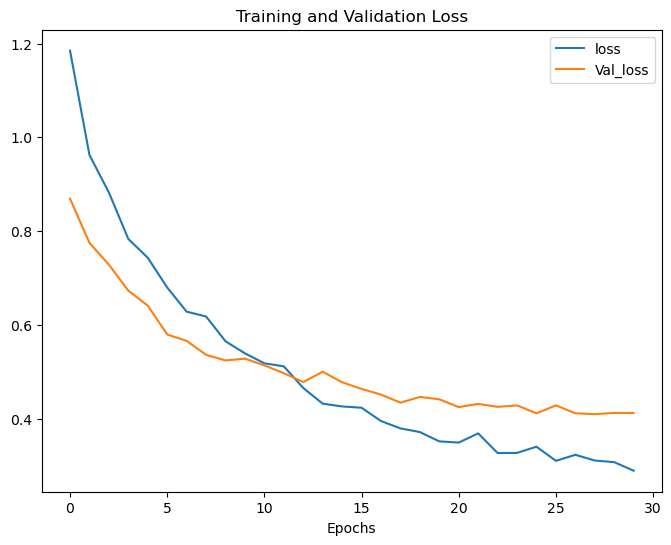

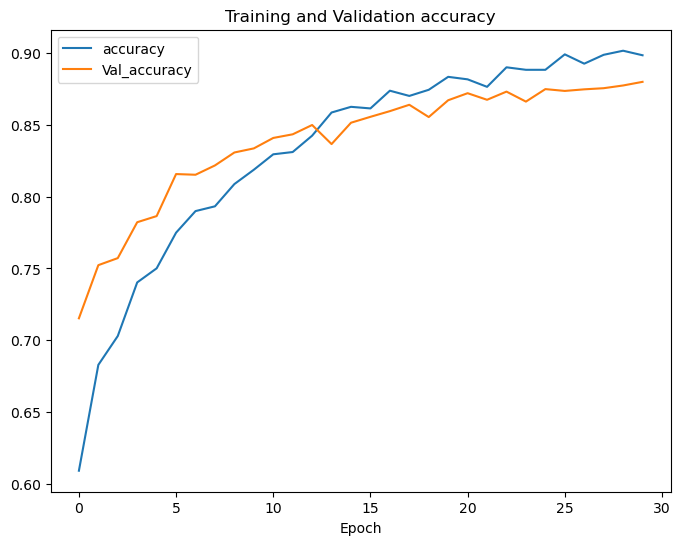

In [48]:
plot_learning(history)

In [49]:
# Evaluate the model on the testing data
test_loss, test_accuracy = eff_model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

99/99 ━━━━━━━━━━━━━━━━━━━━ 237s 2s/step - accuracy: 0.8817 - loss: 0.3665
Test Loss: 0.3686596155166626
Test Accuracy: 0.8866729736328125


In [80]:
from tensorflow.keras.models import load_model
        
# Save the best model for later use
eff_model.save('best_model_pest.keras')